# Version
* `v2`: hyp.finetune.yaml fold3

In [1]:
# !pip install --upgrade seaborn

In [2]:
import numpy as np, pandas as pd
from glob import glob
import shutil, os
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from tqdm.notebook import tqdm
import seaborn as sns

In [3]:
dim = 1024 #512, 256, 'original'
fold = 4

In [4]:
train_df = pd.read_csv(f'./input/vinbigdata-{dim}x{dim}/train.csv')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072


In [5]:
train_df['image_path'] = f'./input/vinbigdata-{dim}x{dim}/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580,./input/vinbigdata-1024x1024/train/50a418190bc...
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159,./input/vinbigdata-1024x1024/train/21a10246a5e...
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,./input/vinbigdata-1024x1024/train/9a5094b2563...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,./input/vinbigdata-1024x1024/train/051132a778e...
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072,./input/vinbigdata-1024x1024/train/063319de25c...


# Only 14 Class

In [6]:
train_df = train_df[train_df.class_id!=14].reset_index(drop = True)

# Pre-Processing

In [7]:
train_df['x_min'] = train_df.apply(lambda row: (row.x_min)/row.width, axis =1)
train_df['y_min'] = train_df.apply(lambda row: (row.y_min)/row.height, axis =1)

train_df['x_max'] = train_df.apply(lambda row: (row.x_max)/row.width, axis =1)
train_df['y_max'] = train_df.apply(lambda row: (row.y_max)/row.height, axis =1)

train_df['x_mid'] = train_df.apply(lambda row: (row.x_max+row.x_min)/2, axis =1)
train_df['y_mid'] = train_df.apply(lambda row: (row.y_max+row.y_min)/2, axis =1)

train_df['w'] = train_df.apply(lambda row: (row.x_max-row.x_min), axis =1)
train_df['h'] = train_df.apply(lambda row: (row.y_max-row.y_min), axis =1)

train_df['area'] = train_df['w']*train_df['h']
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,./input/vinbigdata-1024x1024/train/9a5094b2563...,0.563462,0.686216,0.462500,0.195205,0.090283
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,./input/vinbigdata-1024x1024/train/051132a778e...,0.623915,0.305903,0.150608,0.095833,0.014433
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.309843,0.128581,0.125984,0.024740,0.003117
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,./input/vinbigdata-1024x1024/train/0c7a38f293d...,0.773523,0.472407,0.368053,0.753033,0.277156
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,./input/vinbigdata-1024x1024/train/47ed17dcb2c...,0.239875,0.721145,0.045950,0.039368,0.001809


In [8]:
features = ['x_min', 'y_min', 'x_max', 'y_max', 'x_mid', 'y_mid', 'w', 'h', 'area']
X = train_df[features]
y = train_df['class_id']
X.shape, y.shape

((36096, 9), (36096,))

In [9]:
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

# t-SNE Visualization

In [10]:
# %%time
# from sklearn.manifold import TSNE

# tsne = TSNE(n_components = 2, perplexity = 40, random_state=1, n_iter=5000)
# data_X = X
# data_y = y.loc[data_X.index]
# embs = tsne.fit_transform(data_X)
# # Add to dataframe for convenience
# plot_x = embs[:, 0]
# plot_y = embs[:, 1]

In [11]:
# import matplotlib.pyplot as plt
# plt.figure(figsize = (15, 15))
# plt.axis('off')
# scatter = plt.scatter(plot_x, plot_y, marker = 'o',s = 50, c=data_y.tolist(), alpha= 0.5,cmap='viridis')
# plt.legend(handles=scatter.legend_elements()[0], labels=classes)

# BBox Location

## x_mid Vs y_mid

In [12]:
# from scipy.stats import gaussian_kde


# x_val = train_df.x_mid.values
# y_val = train_df.y_mid.values

# # Calculate the point density
# xy = np.vstack([x_val,y_val])
# z = gaussian_kde(xy)(xy)

# fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
# ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# # ax.set_xlabel('x_mid')
# # ax.set_ylabel('y_mid')
# plt.show()

## bbox_w Vs bbox_h

In [13]:
# x_val = train_df.w.values
# y_val = train_df.h.values

# # Calculate the point density
# xy = np.vstack([x_val,y_val])
# z = gaussian_kde(xy)(xy)

# fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
# ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# # ax.set_xlabel('bbox_width')
# # ax.set_ylabel('bbox_height')
# plt.show()

# Image Aspect Ratio

In [14]:
# x_val = train_df.width.values
# y_val = train_df.height.values

# # Calculate the point density
# xy = np.vstack([x_val,y_val])
# z = gaussian_kde(xy)(xy)

# fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
# ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# # ax.set_xlabel('image_width')
# # ax.set_ylabel('image_height')
# plt.show()

# Split

In [15]:
gkf  = GroupKFold(n_splits = 5)
train_df['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
    train_df.loc[val_idx, 'fold'] = fold
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,./input/vinbigdata-1024x1024/train/9a5094b2563...,0.563462,0.686216,0.462500,0.195205,0.090283,3
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,./input/vinbigdata-1024x1024/train/051132a778e...,0.623915,0.305903,0.150608,0.095833,0.014433,2
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,./input/vinbigdata-1024x1024/train/1c32170b4af...,0.309843,0.128581,0.125984,0.024740,0.003117,4
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,./input/vinbigdata-1024x1024/train/0c7a38f293d...,0.773523,0.472407,0.368053,0.753033,0.277156,2
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,./input/vinbigdata-1024x1024/train/47ed17dcb2c...,0.239875,0.721145,0.045950,0.039368,0.001809,4


In [16]:
train_files = []
val_files   = []
val_files += list(train_df[train_df.fold==fold].image_path.unique())
train_files += list(train_df[train_df.fold!=fold].image_path.unique())
len(train_files), len(val_files)

(3515, 879)

In [17]:
print(train_files[:5])

['./input/vinbigdata-1024x1024/train/9a5094b2563a1ef3ff50dc5c7ff71345.png', './input/vinbigdata-1024x1024/train/051132a778e61a86eb147c7c6f564dfe.png', './input/vinbigdata-1024x1024/train/0c7a38f293d5f5e4846aa4ca6db4daf1.png', './input/vinbigdata-1024x1024/train/d3637a1935a905b3c326af31389cb846.png', './input/vinbigdata-1024x1024/train/afb6230703512afc370f236e8fe98806.png']


# Copying Files

In [18]:
os.makedirs('/root/working/vinbigdata/labels/train', exist_ok = True)
os.makedirs('/root/working/vinbigdata/labels/val', exist_ok = True)
os.makedirs('/root/working/vinbigdata/images/train', exist_ok = True)
os.makedirs('/root/working/vinbigdata/images/val', exist_ok = True)
label_dir = '/root/input/vinbigdata-yolo-labels-dataset/labels'
ensemble_label_dir = '/root/input/VinDr-Bounding-Box-Fusion/labels'
for file in tqdm(train_files):
    shutil.copy(file, '/root/working/vinbigdata/images/train')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(ensemble_label_dir, filename+'.txt'), '/root/working/vinbigdata/labels/train')
    
for file in tqdm(val_files):
    shutil.copy(file, '/root/working/vinbigdata/images/val')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(ensemble_label_dir, filename+'.txt'), './working/vinbigdata/labels/val')

  0%|          | 0/3515 [00:00<?, ?it/s]

  0%|          | 0/879 [00:00<?, ?it/s]

In [19]:
for filename in os.listdir('/root/working/vinbigdata/images/train/'):
    if '051132a778e61a86eb147c7c6f564dfe' in filename:
        print(filename)

051132a778e61a86eb147c7c6f564dfe.png


(1024, 1024)


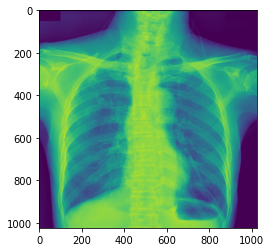

'0 0.5632749795913696 0.423775777220726 0.1444201469421386 0.1376655399799347 \n13 0.2848285922684172 0.3786572220511241 0.1261852662290299 0.18263012011087157 \n13 0.30944566010211527 0.4106867878041269 0.15645514223194748 0.1586079457961195 \n13 0.2700583515681984 0.370495842315984 0.06163384390955507 0.11148752694795196 \n13 0.8072575032711029 0.8730109930038453 0.045344054698943925 0.06426441669464111 \n'

In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread('/root/working/vinbigdata/images/train/64c4cafb533cc198f91e6ddbddee9a0e.png')
print(img.shape)
plt.imshow(img)
plt.show()

f = open('/root/working/vinbigdata/labels/train/64c4cafb533cc198f91e6ddbddee9a0e.txt', 'r')
f.read()


# Get Class Name

In [21]:
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

# [YOLOv5](https://github.com/ultralytics/yolov5)
![](https://user-images.githubusercontent.com/26833433/98699617-a1595a00-2377-11eb-8145-fc674eb9b1a7.jpg)
![](https://user-images.githubusercontent.com/26833433/90187293-6773ba00-dd6e-11ea-8f90-cd94afc0427f.png)

# YOLOv5 Stuff

In [22]:
from os import listdir
from os.path import isfile, join
import yaml

cwd = '/root/working/'

with open(join( cwd , 'train.txt'), 'w') as f:
    for path in glob('/root/working/vinbigdata/images/train/*'):
        f.write(path+'\n')
            
with open(join( cwd , 'val.txt'), 'w') as f:
    for path in glob('/root/working/vinbigdata/images/val/*'):
        f.write(path+'\n')

data = dict(
    train =  join( cwd , 'train.txt') ,
    val   =  join( cwd , 'val.txt' ),
    nc    = 14,
    names = classes
    )

with open(join( cwd , 'vinbigdata.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join( cwd , 'vinbigdata.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- Aortic enlargement
- Atelectasis
- Calcification
- Cardiomegaly
- Consolidation
- ILD
- Infiltration
- Lung Opacity
- Nodule/Mass
- Other lesion
- Pleural effusion
- Pleural thickening
- Pneumothorax
- Pulmonary fibrosis
nc: 14
train: /root/working/train.txt
val: /root/working/val.txt



In [23]:
# https://www.kaggle.com/ultralytics/yolov5
# !git clone https://github.com/ultralytics/yolov5  # clone repo
# %cd yolov5
shutil.copytree('/root/yolov5', '/root/working/yolov5')
# shutil.copytree('/kaggle/input/yolov5hypyaml', '/kaggle/working/yolov5hypyaml')
os.chdir('./working/yolov5')
# %pip install -qr requirements.txt # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.1 _CudaDeviceProperties(name='TITAN RTX', major=7, minor=5, total_memory=24220MB, multi_processor_count=72)


In [24]:
!pwd
!ls

/root/working/yolov5
Dockerfile  data	models		  train.py	  weights
LICENSE     detect.py	requirements.txt  tutorial.ipynb
README.md   hubconf.py	test.py		  utils


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='data/images/', update=False, view_img=False, weights=['yolov5s.pt'])
YOLOv5  torch 1.7.1 CUDA:0 (TITAN RTX, 24220.3125MB)
                    CUDA:1 (TITAN RTX, 24219.0MB)
                    CUDA:2 (TITAN RTX, 24220.3125MB)
                    CUDA:3 (TITAN RTX, 24220.3125MB)

100%|██████████████████████████████████████| 14.1M/14.1M [00:00<00:00, 25.5MB/s]

Fusing layers... 
Model Summary: 224 layers, 7266973 parameters, 0 gradients, 17.0 GFLOPS
image 1/2 /root/working/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, Done. (0.008s)
image 2/2 /root/working/yolov5/data/images/zidane.jpg: 384x640 2 persons, 1 tie, Done. (0.008s)
Results saved to runs/detect/exp
Done. (0.070s)


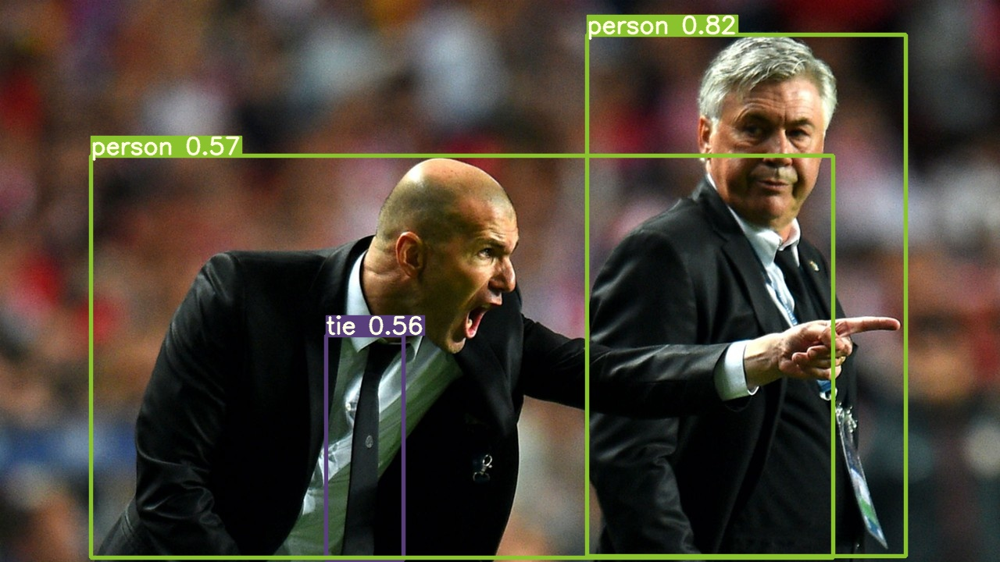

In [25]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/
Image(filename='runs/detect/exp/zidane.jpg', width=600)

## Pretrained Checkpoints:

| Model | AP<sup>val</sup> | AP<sup>test</sup> | AP<sub>50</sub> | Speed<sub>GPU</sub> | FPS<sub>GPU</sub> || params | FLOPS |
|---------- |------ |------ |------ | -------- | ------| ------ |------  |  :------: |
| [YOLOv5s](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | 37.0     | 37.0     | 56.2     | **2.4ms** | **416** || 7.5M   | 13.2B
| [YOLOv5m](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | 44.3     | 44.3     | 63.2     | 3.4ms     | 294     || 21.8M  | 39.4B
| [YOLOv5l](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | 47.7     | 47.7     | 66.5     | 4.4ms     | 227     || 47.8M  | 88.1B
| [YOLOv5x](https://github.com/ultralytics/yolov5/releases/tag/v3.0)    | **49.2** | **49.2** | **67.7** | 6.9ms     | 145     || 89.0M  | 166.4B
| | | | | | || |
| [YOLOv5x](https://github.com/ultralytics/yolov5/releases/tag/v3.0) + TTA|**50.8**| **50.8** | **68.9** | 25.5ms    | 39      || 89.0M  | 354.3B
| | | | | | || |
| [YOLOv3-SPP](https://github.com/ultralytics/yolov5/releases/tag/v3.0) | 45.6     | 45.5     | 65.2     | 4.5ms     | 222     || 63.0M  | 118.0B

# Selecting Models
In this notebok I'm using `v5s`. To select your prefered model just replace `--cfg models/yolov5s.yaml --weights yolov5s.pt` with the following command:
* `v5s` : `--cfg models/yolov5s.yaml --weights yolov5s.pt`
* `v5m` : `--cfg models/yolov5m.yaml --weights yolov5m.pt`
* `v5l` : `--cfg models/yolov5l.yaml --weights yolov5l.pt`
* `v5x` : `--cfg models/yolov5x.yaml --weights yolov5x.pt`

# Train

In [26]:
import os
cwd = os.getcwd()
print(cwd)

/root/working/yolov5


In [39]:
# !WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --nosave --cache
!WANDB_MODE="dryrun" python -m torch.distributed.launch --nproc_per_node 4 train.py --img 768 --batch 64 --epochs 100 --data /root/working/vinbigdata.yaml \
--weights /root/input/yolov5-hyp-yaml/yolov5_fold4_best.pt \
--cache --hyp /root/working/yolov5/data/hyp.finetune.yaml

*****************************************
Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
*****************************************
github: skipping check (not a git repository)
YOLOv5  torch 1.7.1 CUDA:0 (TITAN RTX, 24220.3125MB)
                    CUDA:1 (TITAN RTX, 24219.0MB)
                    CUDA:2 (TITAN RTX, 24220.3125MB)
                    CUDA:3 (TITAN RTX, 24220.3125MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='', data='/root/working/vinbigdata.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=0, hyp='/root/working/yolov5/data/hyp.finetune.yaml', image_weights=False, img_size=[768, 768], linear_lr=False, local_rank=0, log_artifacts=False, log_imgs=16, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train

# Class Distribution

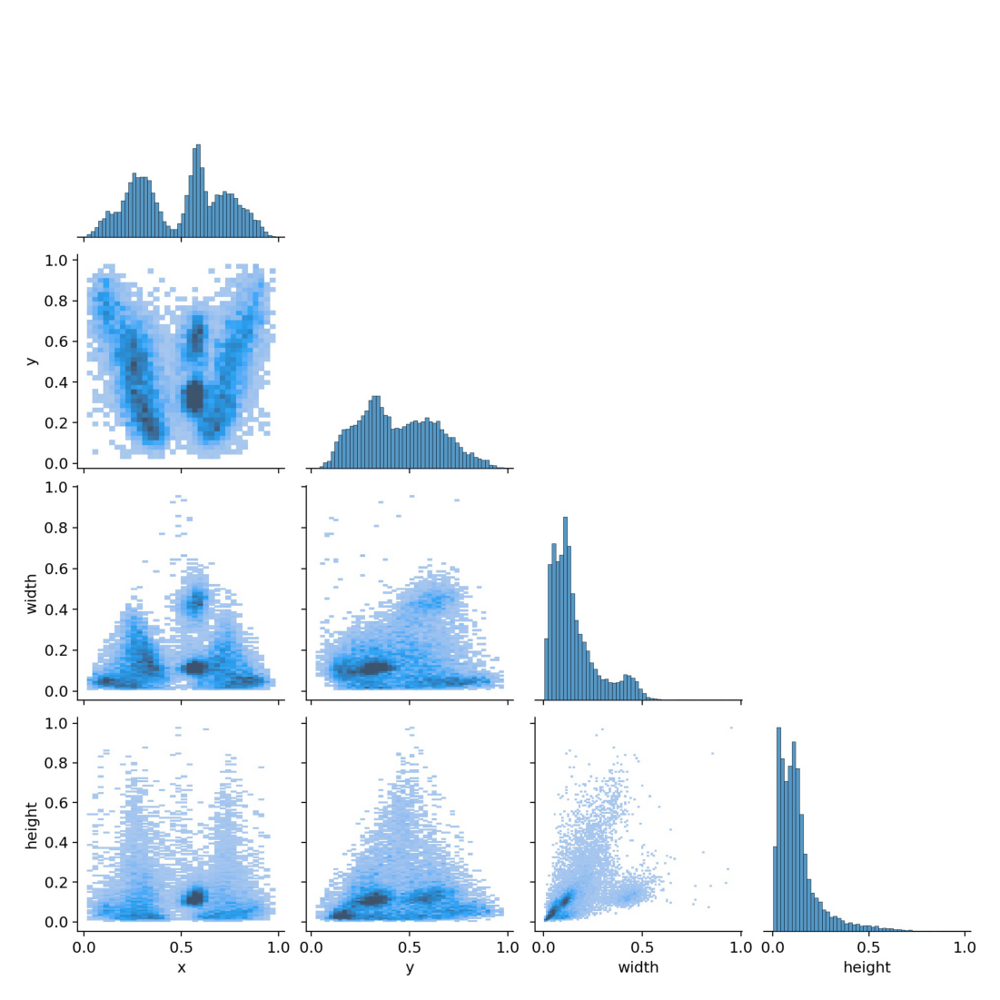

In [40]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels_correlogram.jpg'));

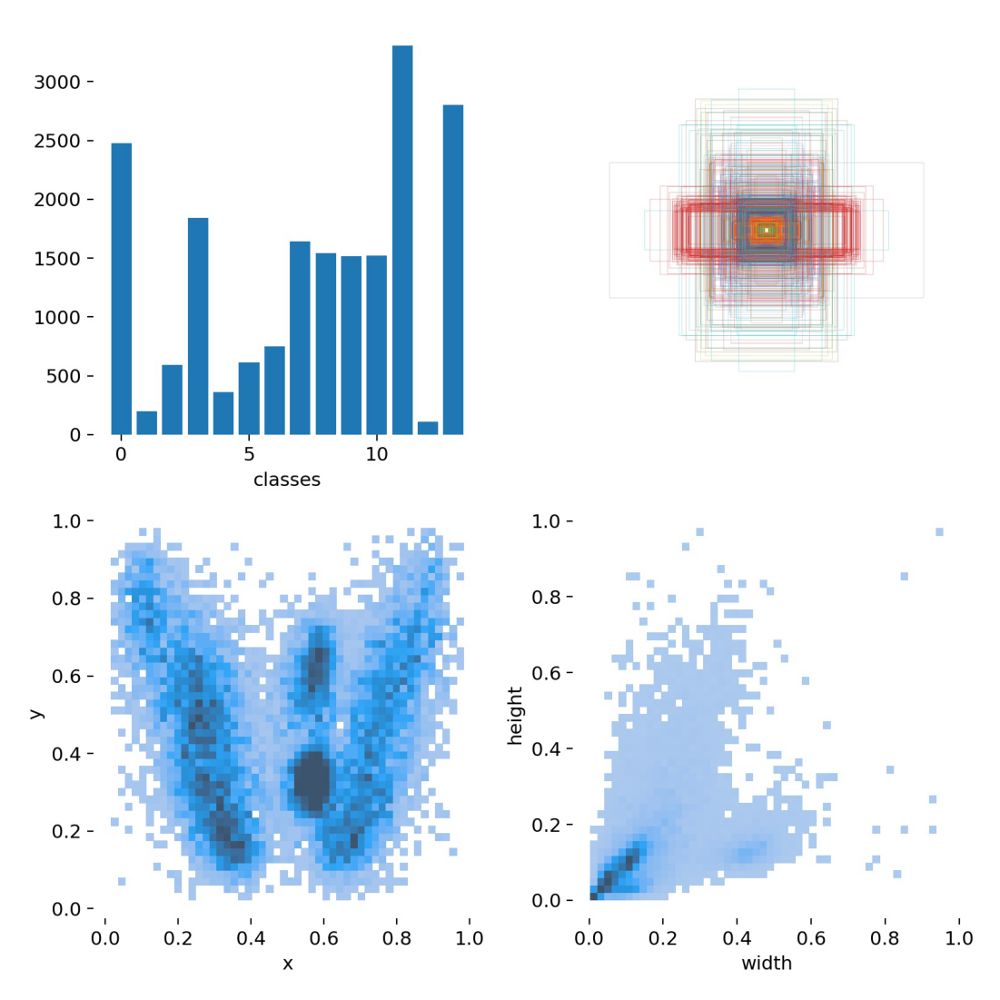

In [41]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels.jpg'));

# Batch Image

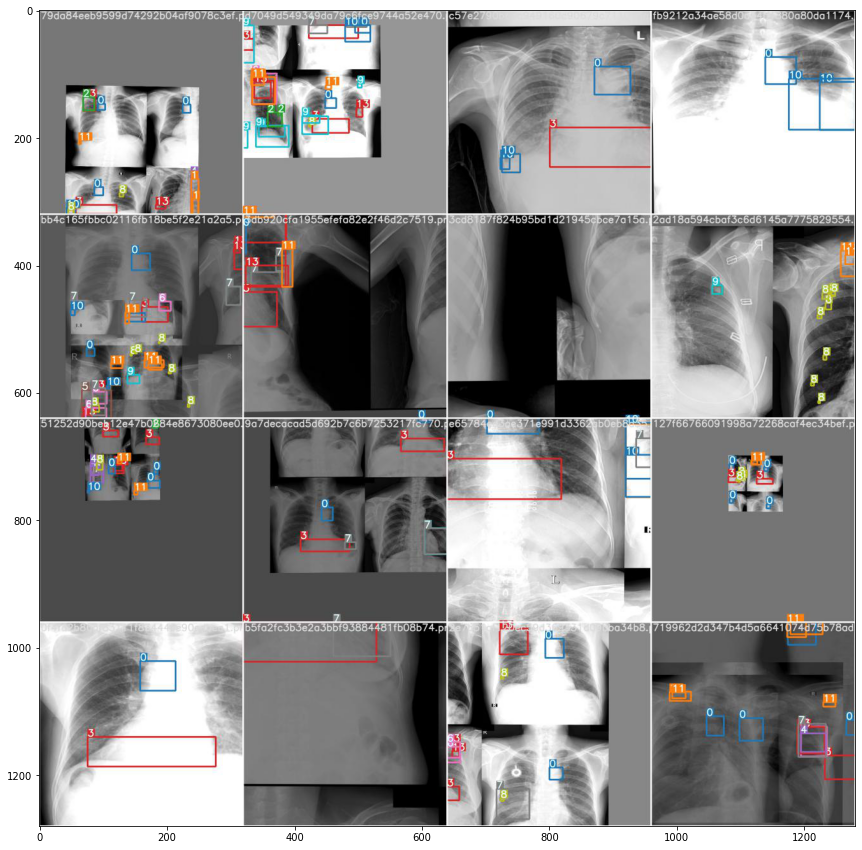

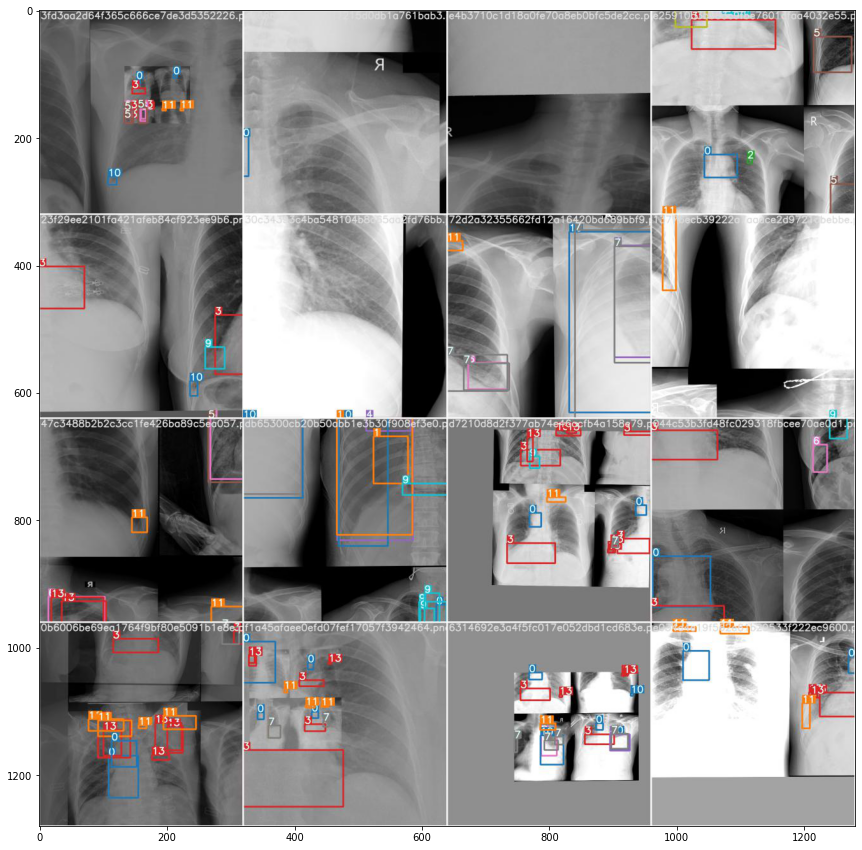

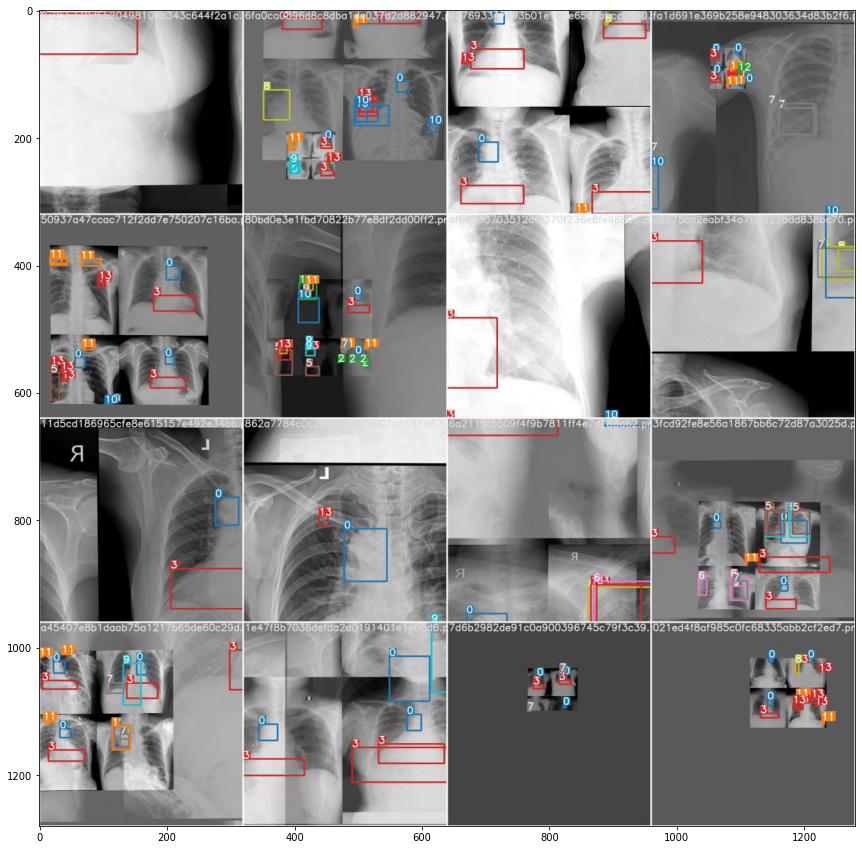

In [42]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch2.jpg'))

# GT Vs Pred

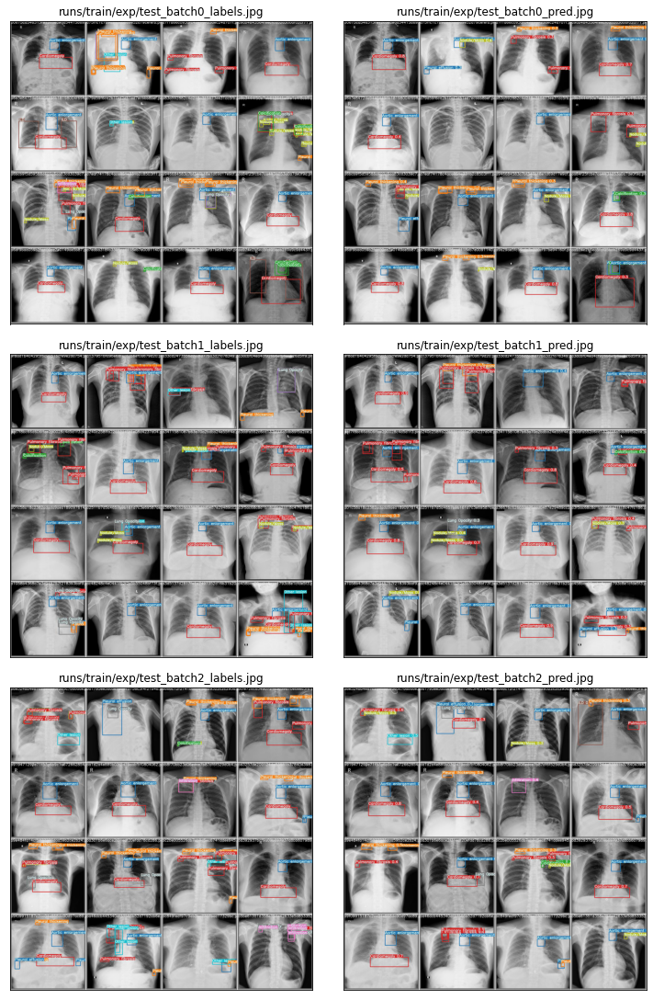

In [43]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'runs/train/exp/test_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/exp/test_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'runs/train/exp/test_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/exp/test_batch{row}_pred.jpg', fontsize = 12)

# (Loss, Map) Vs Epoch

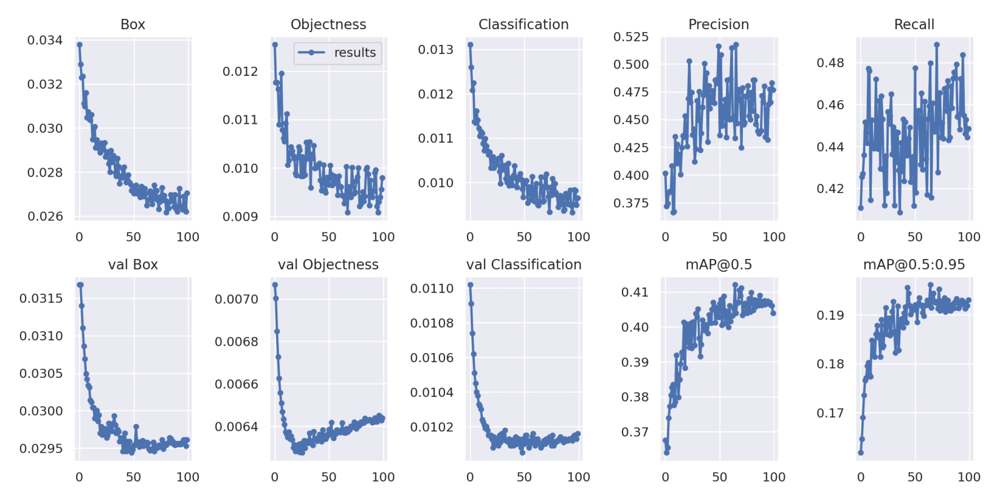

In [44]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/results.png'));

# Precision-Recall Curve

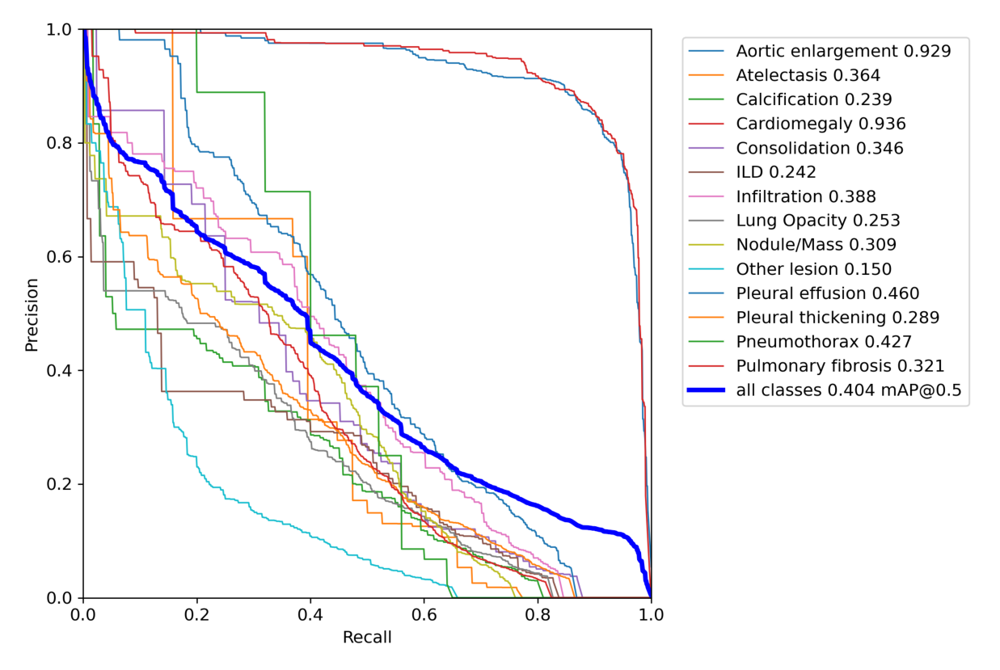

In [45]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/PR_curve.png'));

# F1 Curve

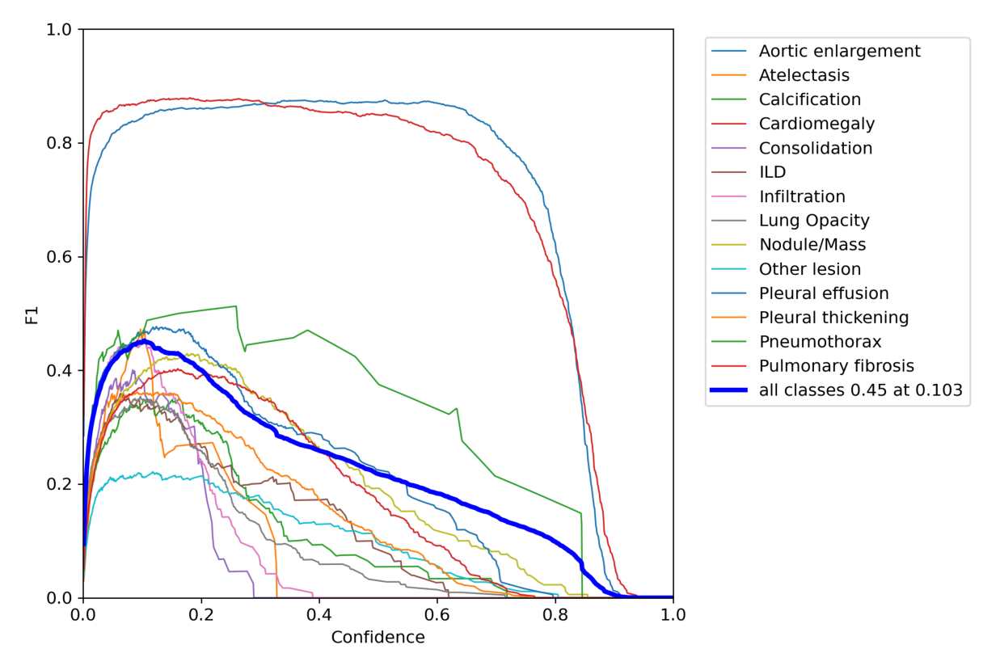

In [46]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/F1_curve.png'));

# Confusion Matrix

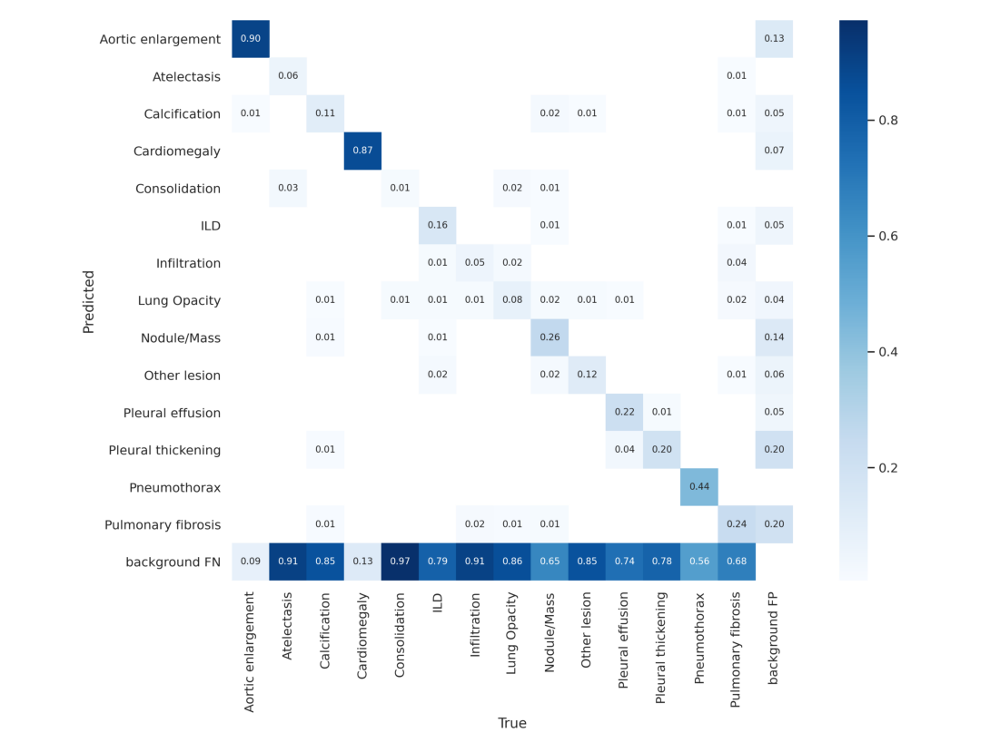

In [47]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/confusion_matrix.png'));

# Inference

In [48]:
!python detect.py --weights 'runs/train/exp/weights/best.pt'\
--img 1024\
--conf 0.15\
--iou 0.5\
--source /root/working/vinbigdata/images/val\
--exist-ok

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.15, device='', exist_ok=True, img_size=1024, iou_thres=0.5, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/root/working/vinbigdata/images/val', update=False, view_img=False, weights=['runs/train/exp/weights/best.pt'])
YOLOv5  torch 1.7.1 CUDA:0 (TITAN RTX, 24220.3125MB)
                    CUDA:1 (TITAN RTX, 24219.0MB)
                    CUDA:2 (TITAN RTX, 24220.3125MB)
                    CUDA:3 (TITAN RTX, 24220.3125MB)

Fusing layers... 
Model Summary: 484 layers, 88478091 parameters, 0 gradients, 220.1 GFLOPS
image 1/879 /root/working/vinbigdata/images/val/00675cd546313f912cadd4ad54415d69.png: 1024x1024 1 Aortic enlargement, 1 Cardiomegaly, 1 Lung Opacity, Done. (0.032s)
image 2/879 /root/working/vinbigdata/images/val/009d4c31ebf87e51c5c8c160a4bd8006.png: 1024x1024 1 Aortic enlargement, 1 Lung Opacity, 1 Pleural effusion, Done. (0.032s)
image 3/879 /root/working/vinbigdata/images/

# Inference Plot

100%|██████████| 16/16 [00:00<00:00, 54.08it/s]


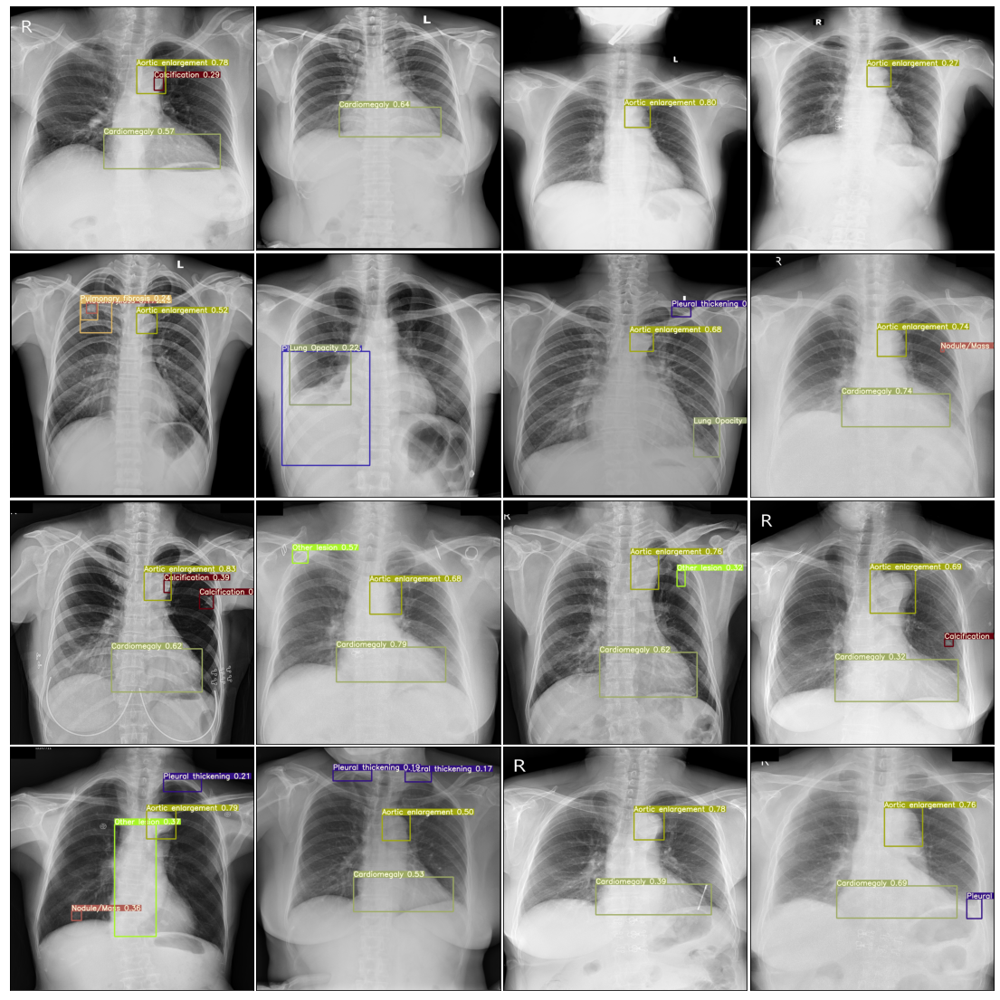

100%|██████████| 16/16 [00:00<00:00, 57.72it/s]


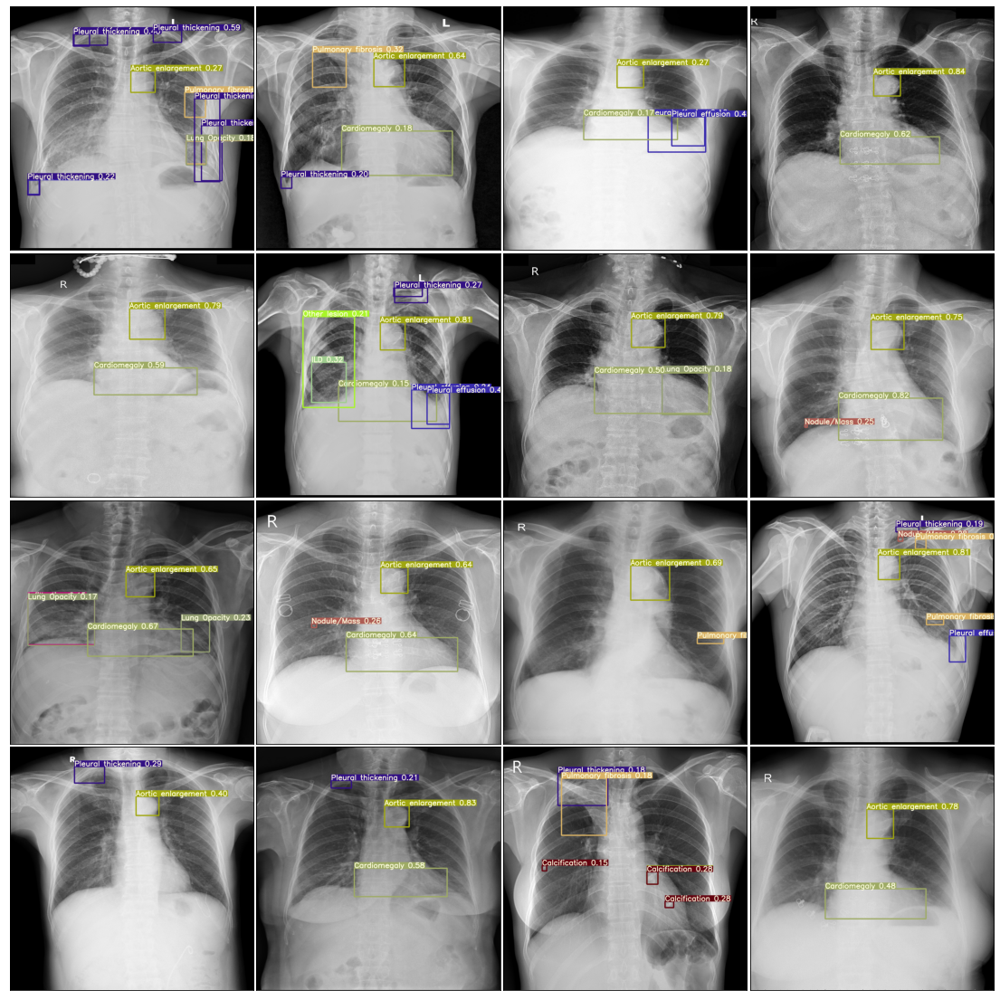

100%|██████████| 16/16 [00:00<00:00, 57.99it/s]


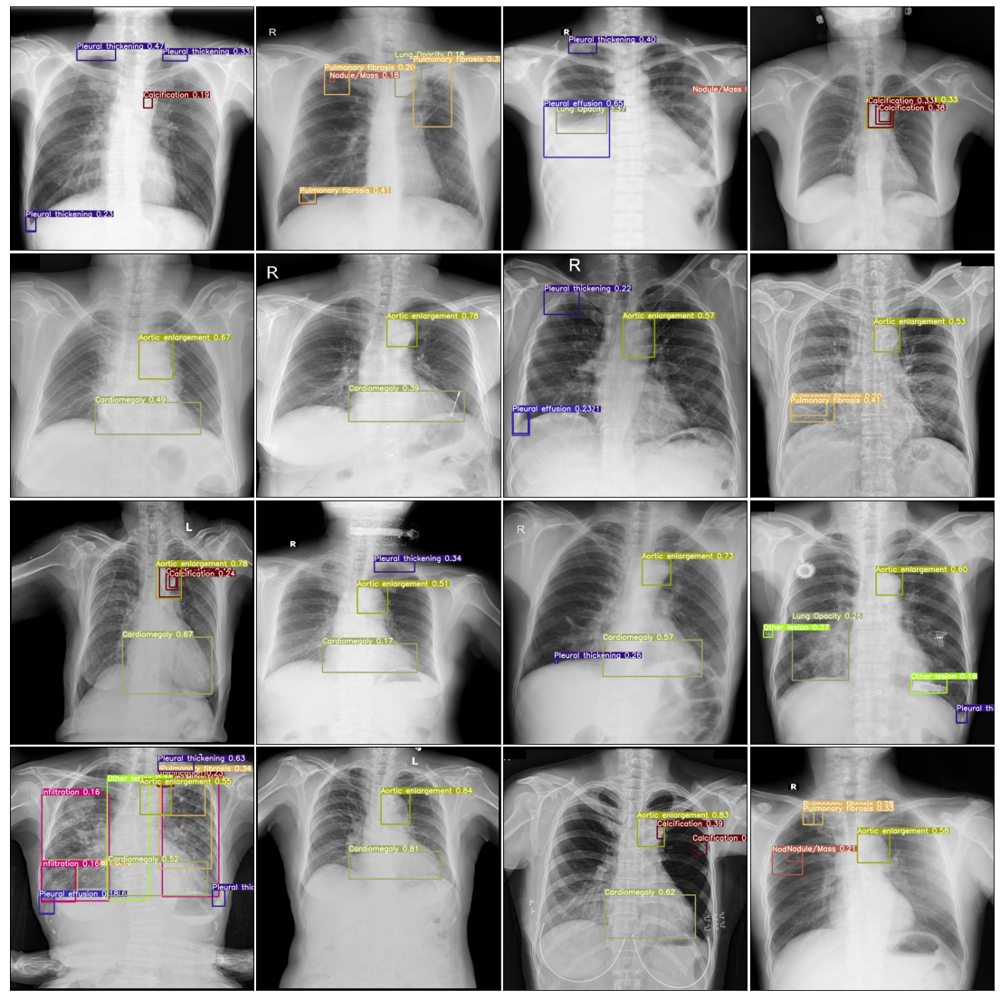

In [49]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import random
import cv2
from glob import glob
from tqdm import tqdm

files = glob('runs/detect/exp/*')
for _ in range(3):
    row = 4
    col = 4
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

In [34]:
# shutil.rmtree('/kaggle/working/vinbigdata')
# shutil.rmtree('runs/detect')
# for file in (glob('runs/train/exp/**/*.png', recursive = True)+glob('runs/train/exp/**/*.jpg', recursive = True)):
#     os.remove(file)